In [6]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

#ML
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import *
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from scipy import stats
from sklearn import preprocessing
from sklearn.model_selection import KFold # import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer
from sklearn import datasets, linear_model

# Input data files are available in the "../" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory
import os
print(os.listdir("../"))
pd.set_option('display.max_columns', None)

['datasets', 'preprocess', 'jupyter_notebooks', 'main.py']


# Data Analysis

## 1.1 Basic analysis of training data

In [8]:
# Training set
train = pd.read_csv("train.csv")

In [9]:
# Data Type of each column
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

In [10]:
# Stats such as mean, max, min for train data
train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [11]:
# For categorical features
train.describe(include='O')

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1452,1460,1460,1460,1423,1423,1422,1423,1422,1460,1460,1460,1459,1460,1460,770,1379,1379,1379,1379,1460,7,281,54,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,1151,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,864,906,1282,647,649,1311,953,430,1256,1428,741,1365,1334,735,1360,380,870,605,1311,1326,1340,3,157,49,1267,1198


In [12]:
# All columns in the train data
train.columns

Index([u'Id', u'MSSubClass', u'MSZoning', u'LotFrontage', u'LotArea',
       u'Street', u'Alley', u'LotShape', u'LandContour', u'Utilities',
       u'LotConfig', u'LandSlope', u'Neighborhood', u'Condition1',
       u'Condition2', u'BldgType', u'HouseStyle', u'OverallQual',
       u'OverallCond', u'YearBuilt', u'YearRemodAdd', u'RoofStyle',
       u'RoofMatl', u'Exterior1st', u'Exterior2nd', u'MasVnrType',
       u'MasVnrArea', u'ExterQual', u'ExterCond', u'Foundation', u'BsmtQual',
       u'BsmtCond', u'BsmtExposure', u'BsmtFinType1', u'BsmtFinSF1',
       u'BsmtFinType2', u'BsmtFinSF2', u'BsmtUnfSF', u'TotalBsmtSF',
       u'Heating', u'HeatingQC', u'CentralAir', u'Electrical', u'1stFlrSF',
       u'2ndFlrSF', u'LowQualFinSF', u'GrLivArea', u'BsmtFullBath',
       u'BsmtHalfBath', u'FullBath', u'HalfBath', u'BedroomAbvGr',
       u'KitchenAbvGr', u'KitchenQual', u'TotRmsAbvGrd', u'Functional',
       u'Fireplaces', u'FireplaceQu', u'GarageType', u'GarageYrBlt',
       u'GarageFinish',

In [13]:
# Total number of columns
len(train.columns)

81

In [14]:
## Number of numerical features
numberic_features=train.select_dtypes(include=[np.number])
numberic_features.columns

Index([u'Id', u'MSSubClass', u'LotFrontage', u'LotArea', u'OverallQual',
       u'OverallCond', u'YearBuilt', u'YearRemodAdd', u'MasVnrArea',
       u'BsmtFinSF1', u'BsmtFinSF2', u'BsmtUnfSF', u'TotalBsmtSF', u'1stFlrSF',
       u'2ndFlrSF', u'LowQualFinSF', u'GrLivArea', u'BsmtFullBath',
       u'BsmtHalfBath', u'FullBath', u'HalfBath', u'BedroomAbvGr',
       u'KitchenAbvGr', u'TotRmsAbvGrd', u'Fireplaces', u'GarageYrBlt',
       u'GarageCars', u'GarageArea', u'WoodDeckSF', u'OpenPorchSF',
       u'EnclosedPorch', u'3SsnPorch', u'ScreenPorch', u'PoolArea', u'MiscVal',
       u'MoSold', u'YrSold', u'SalePrice'],
      dtype='object')

In [15]:
len(numberic_features.columns)

38

In [16]:
numberic_features

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000
5,6,50,85.0,14115,5,5,1993,1995,0.0,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,1993.0,2,480,40,30,0,320,0,0,700,10,2009,143000
6,7,20,75.0,10084,8,5,2004,2005,186.0,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,7,1,2004.0,2,636,255,57,0,0,0,0,0,8,2007,307000
7,8,60,NaN,10382,7,6,1973,1973,240.0,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,1973.0,2,484,235,204,228,0,0,0,350,11,2009,200000
8,9,50,51.0,6120,7,5,1931,1950,0.0,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,8,2,1931.0,2,468,90,0,205,0,0,0,0,4,2008,129900
9,10,190,50.0,7420,5,6,1939,1950,0.0,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,5,2,1939.0,1,205,0,4,0,0,0,0,0,1,2008,118000


In [17]:
## Number of categorical features
categorical_features=train.select_dtypes(include=[np.object])
categorical_features.columns

Index([u'MSZoning', u'Street', u'Alley', u'LotShape', u'LandContour',
       u'Utilities', u'LotConfig', u'LandSlope', u'Neighborhood',
       u'Condition1', u'Condition2', u'BldgType', u'HouseStyle', u'RoofStyle',
       u'RoofMatl', u'Exterior1st', u'Exterior2nd', u'MasVnrType',
       u'ExterQual', u'ExterCond', u'Foundation', u'BsmtQual', u'BsmtCond',
       u'BsmtExposure', u'BsmtFinType1', u'BsmtFinType2', u'Heating',
       u'HeatingQC', u'CentralAir', u'Electrical', u'KitchenQual',
       u'Functional', u'FireplaceQu', u'GarageType', u'GarageFinish',
       u'GarageQual', u'GarageCond', u'PavedDrive', u'PoolQC', u'Fence',
       u'MiscFeature', u'SaleType', u'SaleCondition'],
      dtype='object')

In [18]:
len(categorical_features.columns)

43

In [19]:
categorical_features

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
5,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,Wood,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,NaN,Attchd,Unf,TA,TA,Y,NaN,MnPrv,Shed,WD,Normal
6,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Ex,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
7,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard,Stone,TA,TA,CBlock,Gd,TA,Mn,ALQ,BLQ,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,Shed,WD,Normal
8,RM,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,Gable,CompShg,BrkFace,Wd Shng,None,TA,TA,BrkTil,TA,TA,No,Unf,Unf,GasA,Gd,Y,FuseF,TA,Min1,TA,Detchd,Unf,Fa,TA,Y,NaN,NaN,NaN,WD,Abnorml
9,RL,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,BrkTil,TA,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,Gd,TA,Y,NaN,NaN,NaN,WD,Normal


In [20]:
# Gives an idea of what the training data looks like
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


## 1.2 Figure out how many missing values exist for each column

In [21]:
# Figure out how many null types exist
null_columns=train.columns[train.isnull().any()]
train[null_columns].isnull().sum()

#OUT OF 1460

LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

In [22]:
# Percent of nulls
percent_null = ((train[null_columns].isnull().sum()/len(train[null_columns])) * 100).sort_values(ascending=False)

Text(0,0.5,'Percent of null values + missing values')

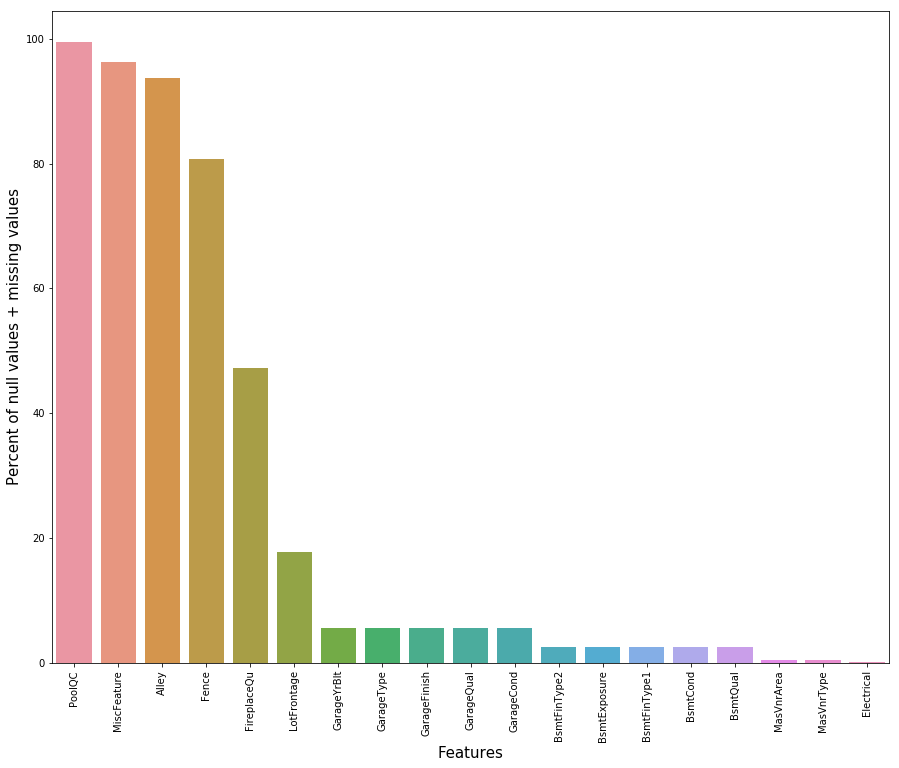

In [23]:
# plot missing + null vals
f, ax = plt.subplots(figsize=(15, 12))
plt.xticks(rotation='90')
sns.barplot(x=percent_null.index, y=percent_null)
plt.xlabel('Features', fontsize=15)
plt.ylabel('Percent of null values + missing values', fontsize=15)

In [24]:
# You can also use .describe to check
train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


## 1.3 Evaluate your target variable

In [25]:
# Stats for your target var
train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

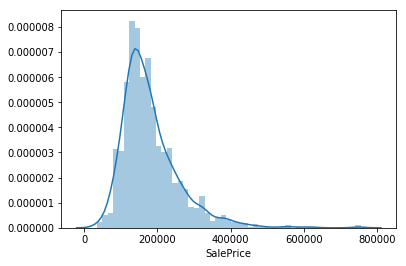

In [26]:
# Evaluate the distribution of the target Variable
sns.distplot(train['SalePrice']);

In [27]:
# Measure skewness and Kurtosis -> Definition can be found here(http://www.pythonforfinance.net/2016/04/04/python-skew-kurtosis/)
print("Skewness: %f" % train['SalePrice'].skew())
print("Kurtosis: %f" % train['SalePrice'].kurt())

Skewness: 1.882876
Kurtosis: 6.536282


In [28]:
#  A symmetrical dataset will have a skewness equal to 0. So, a normal distribution will have a skewness of 0. 
# A SYMMETRICAL normal distribution has a kurtotis of 0/3. 
print("Above data is not symmetrical")


Above data is not symmetrical


## 1.4 Data Visualization

### There are 11 useful plots that you can use to visualize your data 
1. Scatter Plot
2. Box Plot
3. Histogram
4. Multivariate plots
5. Violin plots
6. Pair plots
7. kdeplot
8. Heat Map
9. andrew_curves
10. radviz
11. joinplot


### 1.4.1 Scatter Plots: Used to find the relationship between 2 different quantitative features

In [29]:
columns = numberic_features.columns
columns

Index([u'Id', u'MSSubClass', u'LotFrontage', u'LotArea', u'OverallQual',
       u'OverallCond', u'YearBuilt', u'YearRemodAdd', u'MasVnrArea',
       u'BsmtFinSF1', u'BsmtFinSF2', u'BsmtUnfSF', u'TotalBsmtSF', u'1stFlrSF',
       u'2ndFlrSF', u'LowQualFinSF', u'GrLivArea', u'BsmtFullBath',
       u'BsmtHalfBath', u'FullBath', u'HalfBath', u'BedroomAbvGr',
       u'KitchenAbvGr', u'TotRmsAbvGrd', u'Fireplaces', u'GarageYrBlt',
       u'GarageCars', u'GarageArea', u'WoodDeckSF', u'OpenPorchSF',
       u'EnclosedPorch', u'3SsnPorch', u'ScreenPorch', u'PoolArea', u'MiscVal',
       u'MoSold', u'YrSold', u'SalePrice'],
      dtype='object')

/Users/vdumont/Desktop/UTCV/UTCV_env/lib/python2.7/site-packages/seaborn/axisgrid.py:230: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


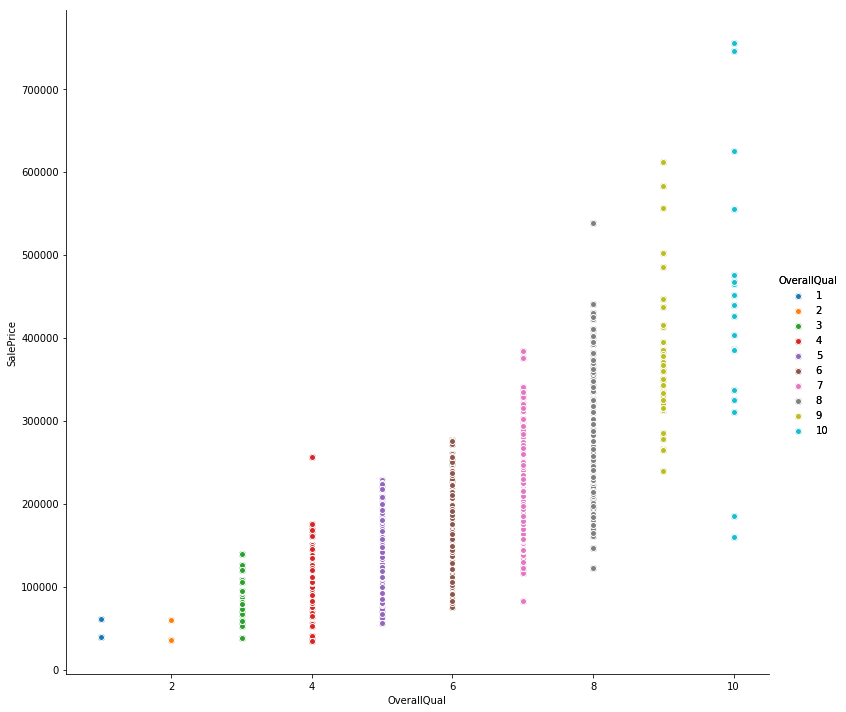

In [30]:
g=sns.FacetGrid(train[columns], hue="OverallQual", size=10) \
   .map(plt.scatter, "OverallQual", "SalePrice") \
   .add_legend()
g=g.map(plt.scatter, "OverallQual", "SalePrice",edgecolor="w").add_legend();
plt.show()
# Tells me that as OverallQual increases, Sale Prices increases in general

### 1.4.2 JointPlot - an adaptation of the scatter plot. Includes a fit line to see the best fit for your data.

/Users/vdumont/Desktop/UTCV/UTCV_env/lib/python2.7/site-packages/seaborn/axisgrid.py:2262: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


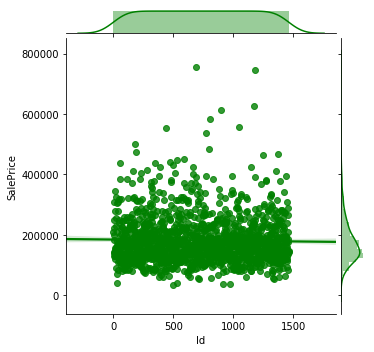

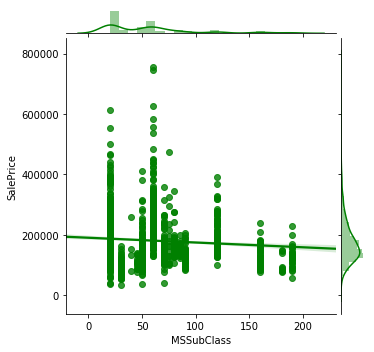

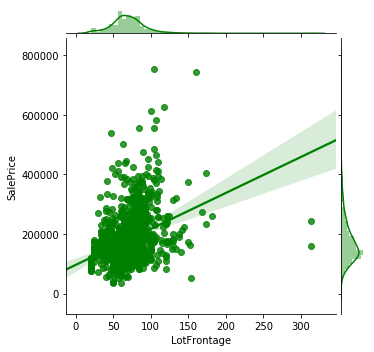

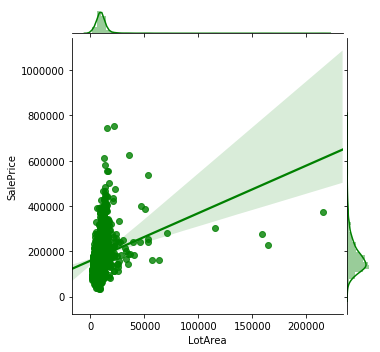

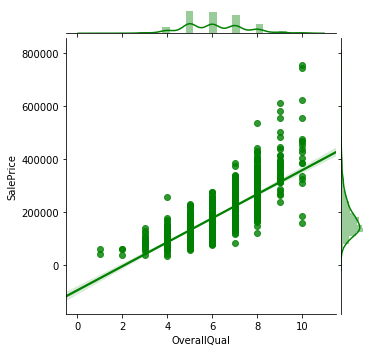

...

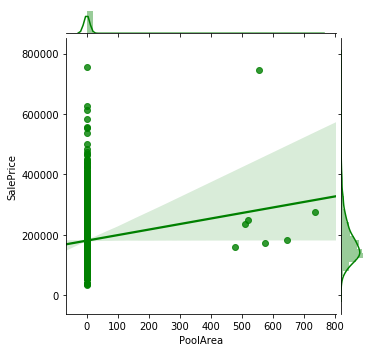

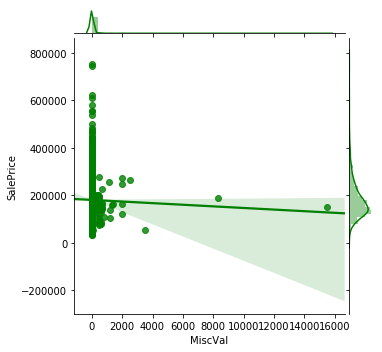

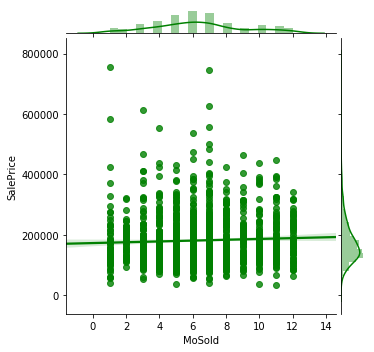

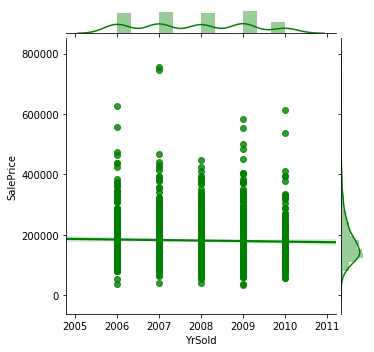

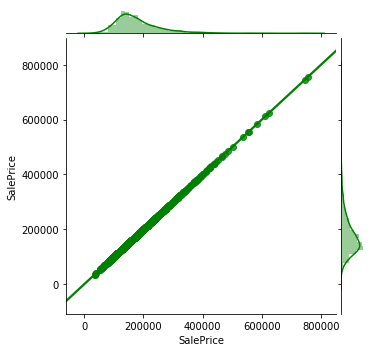

In [31]:
for name in columns:
    sns.jointplot(x=name, y="SalePrice", data=train[columns], size=5,kind="reg",ratio=10,color='green')
    plt.show()

#### Overall Observation:
1. Seems like sale price has few outliers above 700,000
2. OverallQual seems to be increasing with SalePrice
3. TotalBsmtSF has an outlier at 6000, but seems to be increasing with SalePrice
4. GrLivArea seems to be increasing with SalePrice, but has outliers at 4000+
5. Garage Area seems to have few NaN and few outliers at 1250+
6. FullBath increases with SalePrice
7. YearBuilt seems to be increasing with SalePrice, but could have outliers before 1900 and above 200000 (Sale Price)
8. YearRemodAdd seems to be increasing with SalePrice
9. Id is not correlated with SalePrices
10. MSSubClass should be one hot encoded -> No correlation, maybe drop it
11. LotFrontage seems to increase with Sale Price, drop outliers
12. Similar to LotFrontage for LotArea
13. OverallCond should probably be dropped or one hot encoded
14. MasVnrArea seems to have lot of NaNs and few outliers
15.BsmtFinSF1 seems to be correlated with Sale Price and just remove outlier
16. BsmtFinSF2 Should prolly be dropped due to large presence of NaN
17. BsmtUnfSF seems to have lot of 0s or NaN
18. TotalBsmtSF increase with SalePrice, remove outlier
19. 1stFlrSF similar to SalePrice and remove outlier
20.2nd Flr SF has many NaNs
21. Drop LowQualFinSF
22. BsmtFullBath doesn't tell me much. Maybe drop it
23. BsmtHalfBath doesn't tell me much. Maybe drop it
24. HalfBath doesn't tell me much. Maybe drop it
25. BedroomAbvGrade. Maybe split it to read less than 4 and above 4
26. KitchenAbvGrade. Maybe try dropping
27. TotalRmsAboveGrade seems to be increasing with SalePrice.
28. FirePlaces Also seems to be increasing with SalePrice
29. GarageYearBuilt increases with SalePrice
30. GarageCar increases with salePrice
31. GarageArea increases with SalePrice, remove outliers, maybe deal with NaNs
32. WoodDeckSF slightly increasing with SalePrice, but lot of NaNs

### 1.4.3 Box Plot: Used to see the distribution of data of categorical features with target variable

In [32]:
cat_columns = categorical_features.columns
cat_columns

Index([u'MSZoning', u'Street', u'Alley', u'LotShape', u'LandContour',
       u'Utilities', u'LotConfig', u'LandSlope', u'Neighborhood',
       u'Condition1', u'Condition2', u'BldgType', u'HouseStyle', u'RoofStyle',
       u'RoofMatl', u'Exterior1st', u'Exterior2nd', u'MasVnrType',
       u'ExterQual', u'ExterCond', u'Foundation', u'BsmtQual', u'BsmtCond',
       u'BsmtExposure', u'BsmtFinType1', u'BsmtFinType2', u'Heating',
       u'HeatingQC', u'CentralAir', u'Electrical', u'KitchenQual',
       u'Functional', u'FireplaceQu', u'GarageType', u'GarageFinish',
       u'GarageQual', u'GarageCond', u'PavedDrive', u'PoolQC', u'Fence',
       u'MiscFeature', u'SaleType', u'SaleCondition'],
      dtype='object')

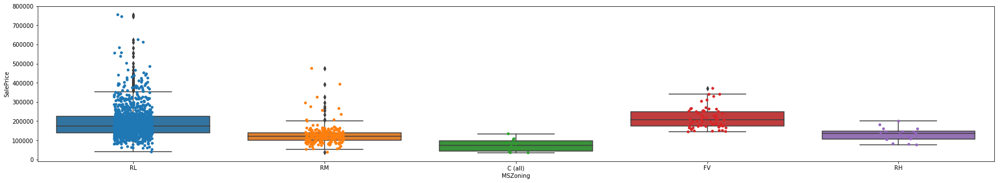

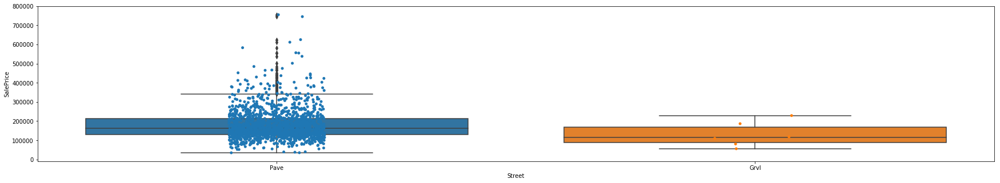

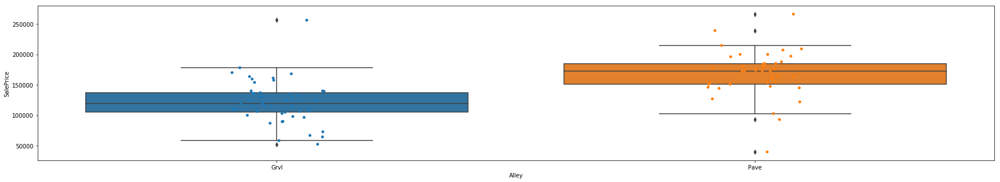

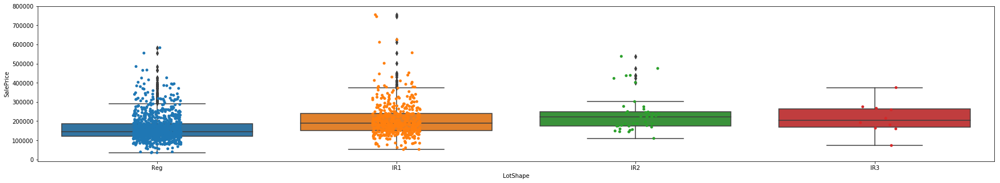

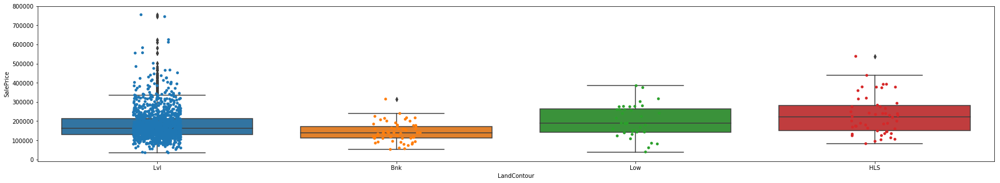

...

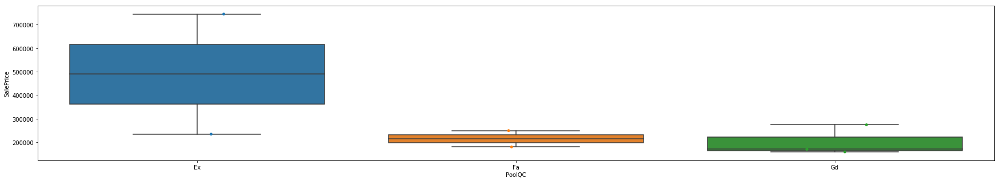

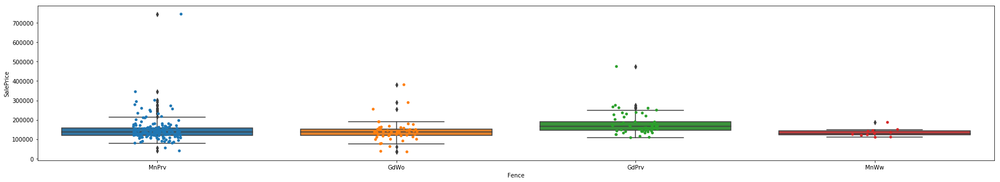

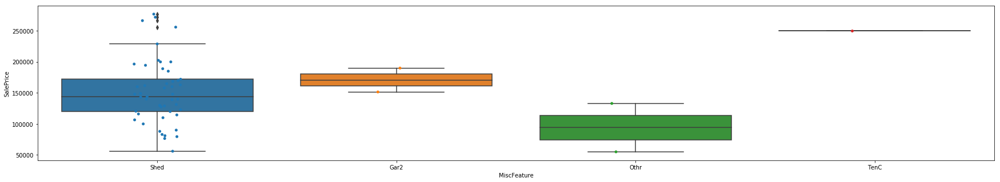

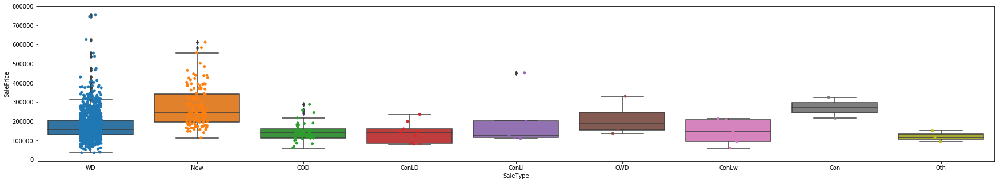

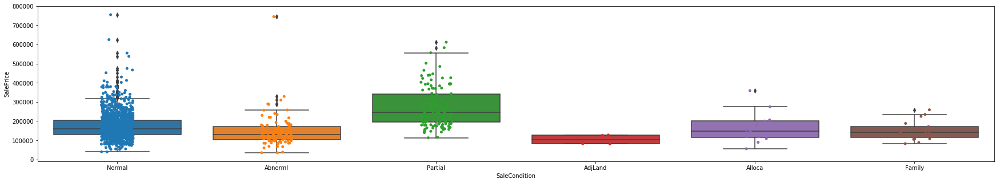

In [33]:
for name in cat_columns:
    plt.subplots(figsize=(30,5))
    sns.boxplot(x=name, y="SalePrice", data=train)
    sns.stripplot(x=name, y="SalePrice", data=train,  size=5, jitter=True, edgecolor="gray")
    plt.show()

### 1.4.4 Violin plots: Used to see the distribution of data of categorical features with target variable. Better representation of box plots

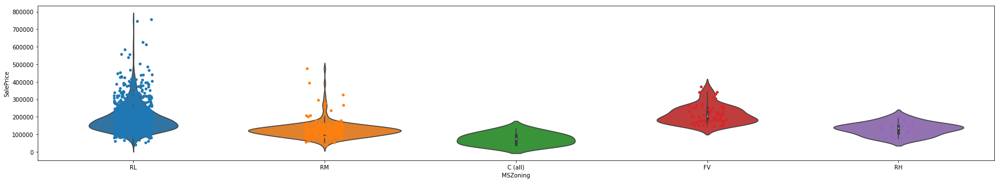

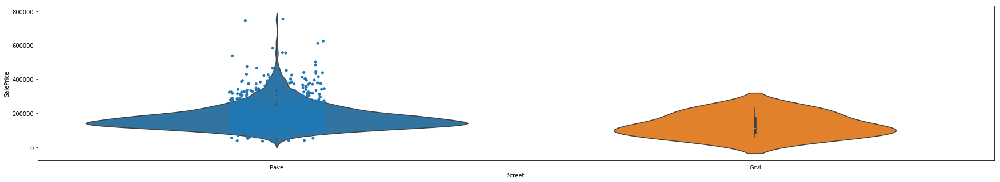

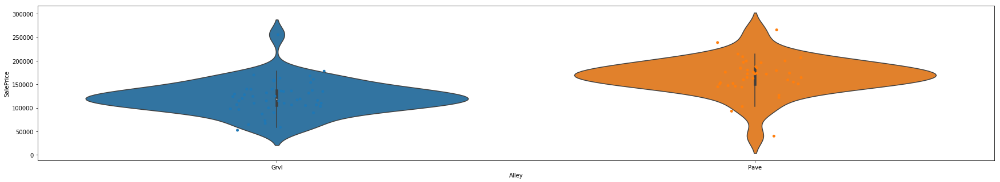

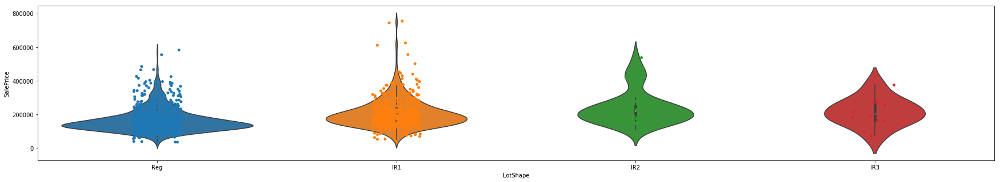

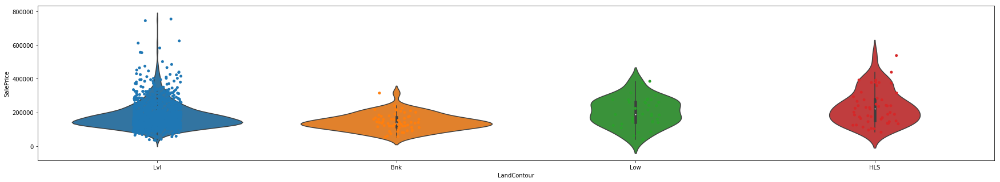

...

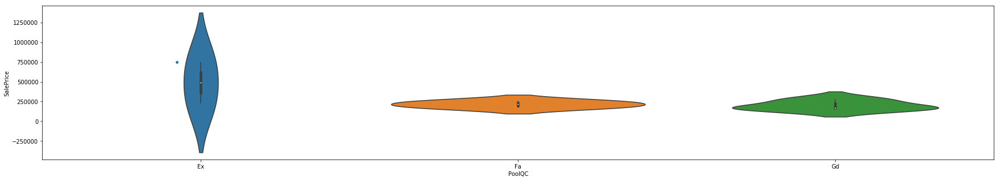

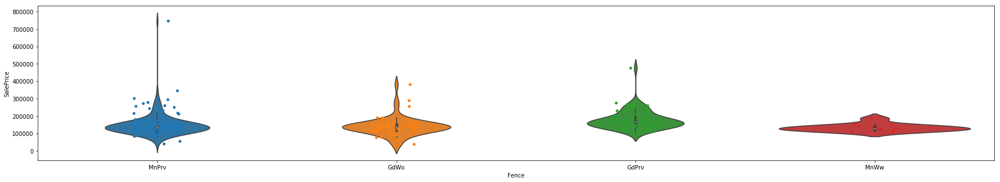

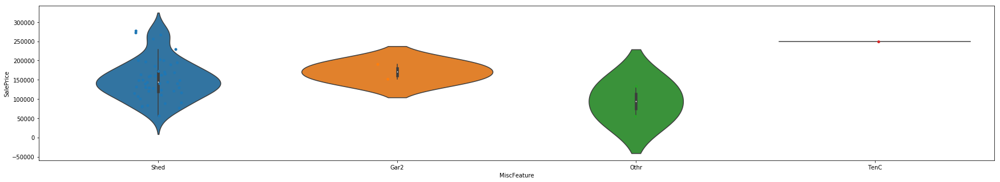

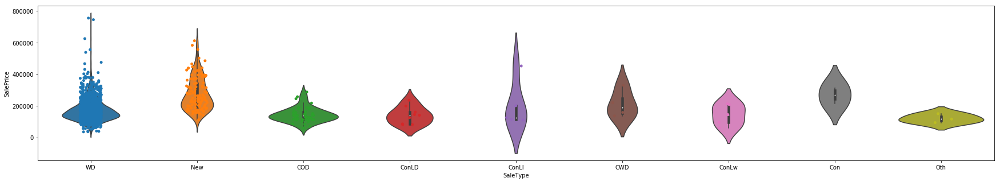

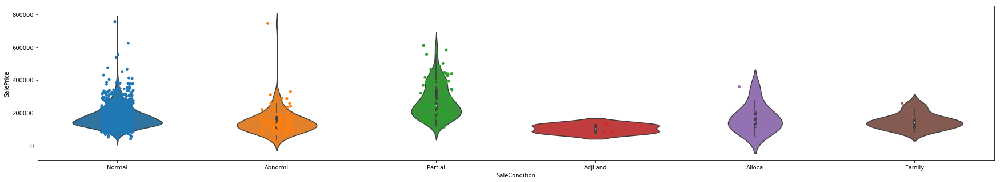

In [34]:
for name in cat_columns:
    plt.subplots(figsize=(30,5))
    sns.violinplot(x=name, y="SalePrice", data=train)
    sns.stripplot(x=name, y="SalePrice", data=train,  size=5, jitter=True, edgecolor="gray")
    plt.show()

### 1.4.5 Histogram: We can also create a histogram of each input variable to get an idea of the distribution

<Figure size 432x288 with 0 Axes>

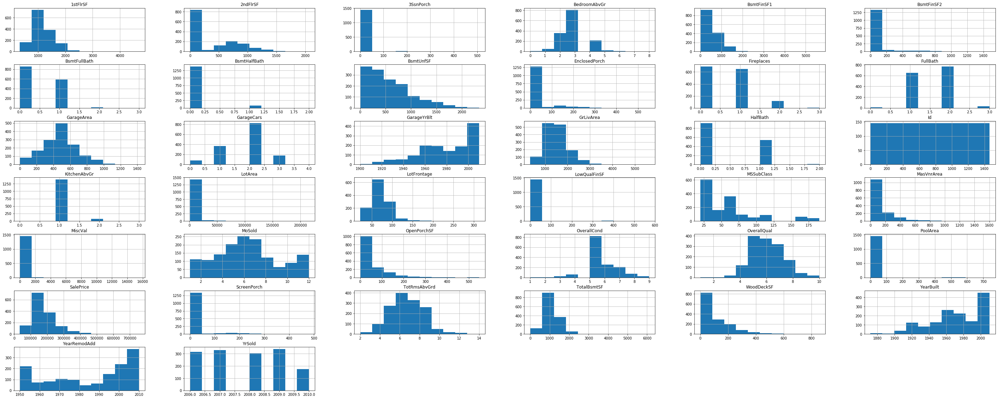

<Figure size 432x288 with 0 Axes>

In [35]:
train.hist(figsize=(50,20))
plt.figure()

### 1.4.6  Multivariate Plots: Used to see the interactions between two different features

In [36]:
# Create a function called "chunks" with two arguments, l and n:
def chunks(l, n):
    # For item i in a range that is a length of l,
    for i in range(0, len(l), n):
        # Create an index range for l of n items:
        yield l[i:i+n]
        
new_cols = list(chunks(columns, 10))
new_cols

[Index([u'Id', u'MSSubClass', u'LotFrontage', u'LotArea', u'OverallQual',
        u'OverallCond', u'YearBuilt', u'YearRemodAdd', u'MasVnrArea',
        u'BsmtFinSF1'],
       dtype='object'),
 Index([u'BsmtFinSF2', u'BsmtUnfSF', u'TotalBsmtSF', u'1stFlrSF', u'2ndFlrSF',
        u'LowQualFinSF', u'GrLivArea', u'BsmtFullBath', u'BsmtHalfBath',
        u'FullBath'],
       dtype='object'),
 Index([u'HalfBath', u'BedroomAbvGr', u'KitchenAbvGr', u'TotRmsAbvGrd',
        u'Fireplaces', u'GarageYrBlt', u'GarageCars', u'GarageArea',
        u'WoodDeckSF', u'OpenPorchSF'],
       dtype='object'),
 Index([u'EnclosedPorch', u'3SsnPorch', u'ScreenPorch', u'PoolArea', u'MiscVal',
        u'MoSold', u'YrSold', u'SalePrice'],
       dtype='object')]

<Figure size 432x288 with 0 Axes>

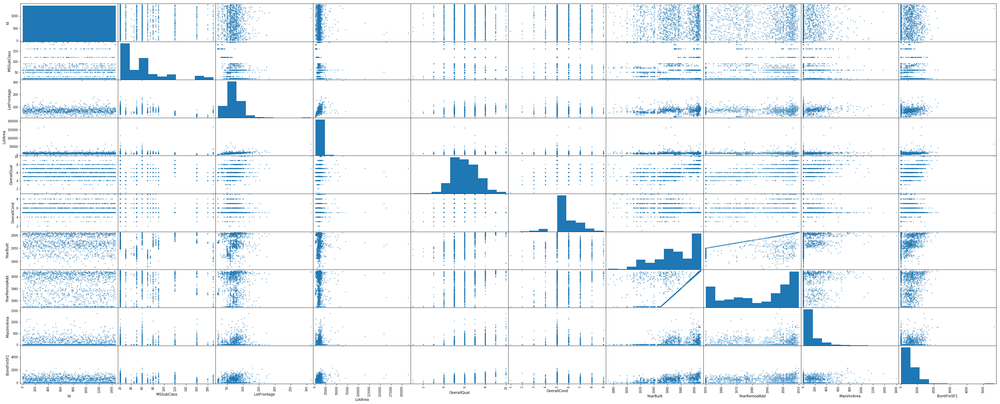

<Figure size 432x288 with 0 Axes>

In [37]:
pd.plotting.scatter_matrix(train[new_cols[0]],figsize=(50,20))
plt.figure()

<Figure size 432x288 with 0 Axes>

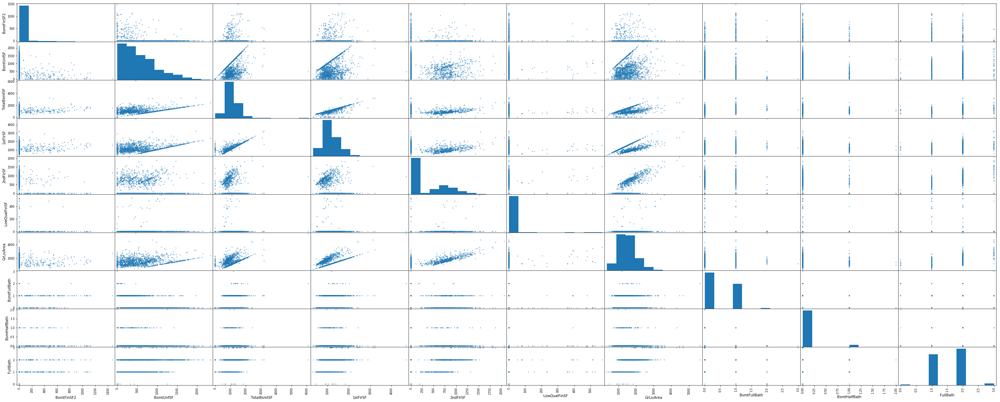

<Figure size 432x288 with 0 Axes>

In [38]:
pd.plotting.scatter_matrix(train[new_cols[1]],figsize=(50,20))
plt.figure()

<Figure size 432x288 with 0 Axes>

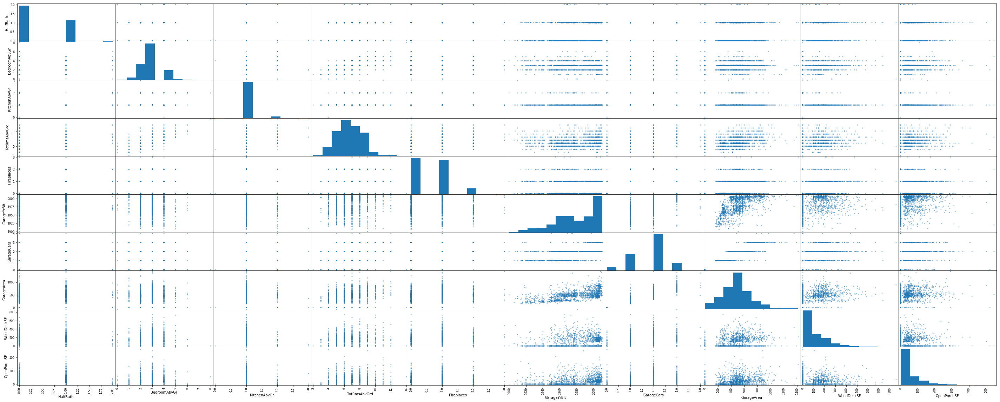

<Figure size 432x288 with 0 Axes>

In [39]:
pd.plotting.scatter_matrix(train[new_cols[2]],figsize=(50,20))
plt.figure()

<Figure size 432x288 with 0 Axes>

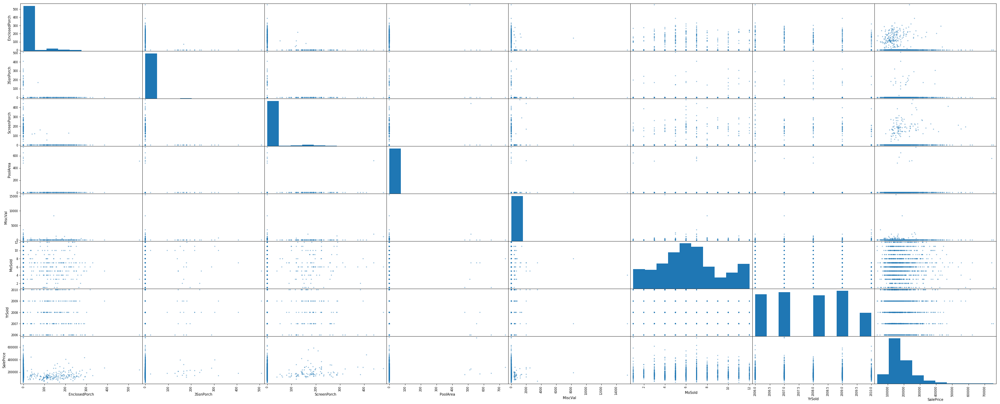

<Figure size 432x288 with 0 Axes>

In [40]:
pd.plotting.scatter_matrix(train[new_cols[3]],figsize=(50,20))
plt.figure()

## 2. Feature Engineering

### 2.1 Set up Cross Validation

In [41]:
kf = KFold(n_splits=3) # Define the split - into 3 folds 

#### Performance Metrics for cross Val

In [42]:
import math

#A function to calculate Root Mean Squared Logarithmic Error (RMSLE)
def rmsle(y_pred, y_test) : 
    assert len(y_test) == len(y_pred)
    return np.sqrt(np.mean((np.log1p(y_pred) - np.log1p(y_test))**2))

rmsle_score = make_scorer(rmsle, greater_is_better=False)

In [43]:
from math import (exp, expm1)

#A function to calculate Root Mean Squared Logarithmic Error (RMSLE)
def rmsle_log(y_pred, y_test) : 
    assert len(y_test) == len(y_pred)
    print(np.mean((y_pred - y_test)**2))
    return np.sqrt(np.mean((np.log1p(np.expm1(y_pred)) - np.log1p(np.expm1(y_test)))**2))

rmsle_score_log = make_scorer(rmsle_log, greater_is_better=False)

### 2.2 Set up a constant model to test it against - Here I chose Logistic Regressions

In [44]:
# Logistic regression
def linearRegressionPerformance(X, y):
    predictionModel = linear_model.LinearRegression()
    scores_accuracy = -cross_val_score(predictionModel, X, y, cv=3, scoring=rmsle_score)
    print((scores_accuracy))
    print('K-fold cross-validation results:')
    print(predictionModel.__class__.__name__+" average mean_squared_log_error is %2.3f" % scores_accuracy.mean())



In [45]:
# Logistic regression
def linearRegressionPerformanceLog(X, y):
    predictionModel = linear_model.LinearRegression()
    scores_accuracy = -cross_val_score(predictionModel, X, y, cv=3, scoring=rmsle_score_log)
    print((scores_accuracy))
    print('K-fold cross-validation results:')
    print(predictionModel.__class__.__name__+" average mean_squared_log_error is %2.3f" % scores_accuracy.mean())

In [46]:
# Normalized Logistic Regression
def normalizedlinearRegressionPerformance(X, y):

    x = X.values #returns a numpy array
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(x)
    df = pd.DataFrame(x_scaled, columns=X.columns)
    predictionModel = linear_model.LinearRegression()
    scores_accuracy = cross_val_score(predictionModel, df, y, cv=3, scoring=rmsle_score)
    print(scores_accuracy)
    print('K-fold cross-validation results:')
    print(predictionModel.__class__.__name__+" average mean_squared_log_error is %2.3f" % scores_accuracy.mean())




In [47]:
# Normalized Logistic Regression
def normalizedlinearRegressionPerformanceLog(X, y):

    x = X.values #returns a numpy array
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(x)
    df = pd.DataFrame(x_scaled, columns=X.columns)
    predictionModel = linear_model.LinearRegression()
    print(y)
    scores_accuracy = cross_val_score(predictionModel, df, y, cv=3, scoring=rmsle_score_log)
    print(scores_accuracy)
    print('K-fold cross-validation results:')
    print(predictionModel.__class__.__name__+" average mean_squared_log_error is %2.3f" % scores_accuracy.mean())




### 2.3 Evaluate a Baseline Model to see how your new features are doing relative to the baseline model

In [48]:
modelTrainData,modelValidationData =  train_test_split(train.copy(), test_size=0.2)

NameError: name 'train_test_split' is not defined

In [ ]:
meanSalePrice = modelTrainData['SalePrice'].mean()
print(meanSalePrice)

In [ ]:
modelValidationData['predictedSalePrice'] = meanSalePrice 

In [ ]:
rmsle(modelValidationData['SalePrice'], modelValidationData['predictedSalePrice'])

### 2.4 Feature Engineering Performance

#### 2.4.1.1 Basic Model: Filling missing values(Method 1) + Existing features + One hot encoded categorical features + Drop any features less than 50% of data

In [ ]:
# Figure out how many null + missing vals types exist
null_columns=train.columns[train.isnull().any()]
train[null_columns].isnull().sum()

#OUT OF 1460

In [ ]:
# Percent of nulls
percent_null = ((train[null_columns].isnull().sum()/len(train[null_columns])) * 100).sort_values(ascending=False)
percent_null

In [ ]:
# plot missing + null vals
f, ax = plt.subplots(figsize=(15, 12))
plt.xticks(rotation='90')
sns.barplot(x=percent_null.index, y=percent_null)
plt.xlabel('Features', fontsize=15)
plt.ylabel('Percent of null values + missing values', fontsize=15)

In [ ]:
#ONE HOT ENCODED TRAIN - DECIDED TO DROP FIRST 5 VALS
trainDropped = train.drop(columns=['Id', 'Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature']).copy()

In [ ]:
TrainOneHot = trainDropped.copy()

In [ ]:
# Simple method of filling in missing values - Fill in numerical value with median and cat values with most frequent cat
TrainOneHot['MasVnrArea'] = TrainOneHot['MasVnrArea'].fillna(TrainOneHot['MasVnrArea'].median())
TrainOneHot['LotFrontage'] = TrainOneHot['LotFrontage'].fillna(TrainOneHot['LotFrontage'].median())
TrainOneHot['GarageYrBlt'] = TrainOneHot['GarageYrBlt'].fillna(TrainOneHot['GarageYrBlt'].median())
TrainOneHot['MasVnrType'] = TrainOneHot['MasVnrType'].fillna(TrainOneHot['MasVnrType'].value_counts().index[0])
TrainOneHot['Electrical'] = TrainOneHot['Electrical'].fillna(TrainOneHot['Electrical'].value_counts().index[0])
TrainOneHot['BsmtFinType2'] = TrainOneHot['BsmtFinType2'].fillna(TrainOneHot['BsmtFinType2'].value_counts().index[0])
TrainOneHot['BsmtFinType1'] = TrainOneHot['BsmtFinType1'].fillna(TrainOneHot['BsmtFinType1'].value_counts().index[0])
TrainOneHot['BsmtExposure'] = TrainOneHot['BsmtExposure'].fillna(TrainOneHot['BsmtExposure'].value_counts().index[0])
TrainOneHot['BsmtCond'] = TrainOneHot['BsmtCond'].fillna(TrainOneHot['BsmtCond'].value_counts().index[0])
TrainOneHot['BsmtQual'] = TrainOneHot['BsmtQual'].fillna(TrainOneHot['BsmtQual'].value_counts().index[0])
TrainOneHot['GarageType'] = TrainOneHot['GarageType'].fillna(TrainOneHot['GarageType'].value_counts().index[0])
TrainOneHot['GarageFinish'] = TrainOneHot['GarageFinish'].fillna(TrainOneHot['GarageFinish'].value_counts().index[0])
TrainOneHot['GarageQual'] = TrainOneHot['GarageQual'].fillna(TrainOneHot['GarageQual'].value_counts().index[0])
TrainOneHot['GarageCond'] = TrainOneHot['GarageCond'].fillna(TrainOneHot['GarageCond'].value_counts().index[0])

In [ ]:
TrainOneHot = pd.get_dummies(TrainOneHot, columns=TrainOneHot.columns[TrainOneHot.dtypes == 'object'],drop_first=True)
TrainOneHot = pd.get_dummies(TrainOneHot, columns=['MSSubClass'], drop_first=True)
TrainOneHot.info()

In [ ]:
y = TrainOneHot['SalePrice'].copy()
X = TrainOneHot.drop(columns = ['SalePrice']).copy()

In [ ]:
linearRegressionPerformance(X,y)

#### Basic Model Accuracy - 0.186

#### 2.4.1.2 Test Model 2: Filling in missing values(Method 2) + one hot + dropping any feature with less than 50% data

In [ ]:
test_model_copy = trainDropped.copy()

In [ ]:
test_model_copy["LotFrontage"] = test_model_copy.groupby("Neighborhood")["LotFrontage"].transform(
    lambda x_v: x_v.fillna(x_v.median()))
test_model_2 = test_model_copy.copy()

In [ ]:
test_model_2['MasVnrArea'] = test_model_2['MasVnrArea'].fillna(test_model_2['MasVnrArea'].median())
test_model_2['MasVnrType'] = test_model_2['MasVnrType'].fillna(test_model_2['MasVnrType'].value_counts().index[0])
test_model_2['GarageYrBlt'] = test_model_2['GarageYrBlt'].fillna(test_model_2['GarageYrBlt'].median())
test_model_2['MasVnrType'] = test_model_2['MasVnrType'].fillna(test_model_2['MasVnrType'].value_counts().index[0])
test_model_2['Electrical'] = test_model_2['Electrical'].fillna(test_model_2['Electrical'].value_counts().index[0])
test_model_2['BsmtFinType2'] = test_model_2['BsmtFinType2'].fillna(test_model_2['BsmtFinType2'].value_counts().index[0])
test_model_2['BsmtFinType1'] = test_model_2['BsmtFinType1'].fillna(test_model_2['BsmtFinType1'].value_counts().index[0])
test_model_2['BsmtExposure'] = test_model_2['BsmtExposure'].fillna(test_model_2['BsmtExposure'].value_counts().index[0])
test_model_2['BsmtCond'] = test_model_2['BsmtCond'].fillna(test_model_2['BsmtCond'].value_counts().index[0])
test_model_2['BsmtQual'] = test_model_2['BsmtQual'].fillna(test_model_2['BsmtQual'].value_counts().index[0])
test_model_2['GarageType'] = test_model_2['GarageType'].fillna(test_model_2['GarageType'].value_counts().index[0])
test_model_2['GarageFinish'] = test_model_2['GarageFinish'].fillna(test_model_2['GarageFinish'].value_counts().index[0])
test_model_2['GarageQual'] = test_model_2['GarageQual'].fillna(test_model_2['GarageQual'].value_counts().index[0])
test_model_2['GarageCond'] = test_model_2['GarageCond'].fillna(test_model_2['GarageCond'].value_counts().index[0])

In [ ]:
test_model_2["LotFrontage"] = test_model_2.groupby("Neighborhood")["LotFrontage"].transform(
    lambda x_v: x_v.fillna(x_v.median()))

In [ ]:
test_model_2 = pd.get_dummies(test_model_2, columns=test_model_2.columns[test_model_2.dtypes == 'object'],drop_first=True)
test_model_2 = pd.get_dummies(test_model_2, columns=['MSSubClass'], drop_first=True)
test_model_2.info()

In [ ]:
y_2 = test_model_2['SalePrice'].copy()
X_2 = test_model_2.drop(columns = ['SalePrice']).copy()

In [ ]:
linearRegressionPerformance(X_2,y_2)

#### Filling in median of neighboorhood for LotFrontage is doing better - 0.185

#### 2.4.1.3 Test Model 3: Filling in missing values(Method 3 - fill in 0s instead of median) + one hot + dropping any feature with less than 50% data

In [ ]:
test_model_3_copy = test_model_copy.copy()

In [ ]:
test_model_3_copy['MasVnrArea'] = test_model_3_copy['MasVnrArea'].fillna(0)
test_model_3_copy['MasVnrType'] = test_model_3_copy['MasVnrType'].fillna('None')
test_model_3_copy['GarageYrBlt'] = test_model_3_copy['GarageYrBlt'].fillna(0)
test_model_3_copy['Electrical'] = test_model_3_copy['Electrical'].fillna(test_model_3_copy['Electrical'].value_counts().index[0])
test_model_3_copy['BsmtFinType2'] = test_model_3_copy['BsmtFinType2'].fillna('None')
test_model_3_copy['BsmtFinType1'] = test_model_3_copy['BsmtFinType1'].fillna('None')
test_model_3_copy['BsmtExposure'] = test_model_3_copy['BsmtExposure'].fillna('None')
test_model_3_copy['BsmtCond'] = test_model_3_copy['BsmtCond'].fillna('None')
test_model_3_copy['BsmtQual'] = test_model_3_copy['BsmtQual'].fillna('None')
test_model_3_copy['GarageType'] = test_model_3_copy['GarageType'].fillna('None')
test_model_3_copy['GarageFinish'] = test_model_3_copy['GarageFinish'].fillna('None')
test_model_3_copy['GarageQual'] = test_model_3_copy['GarageQual'].fillna('None')
test_model_3_copy['GarageCond'] = test_model_3_copy['GarageCond'].fillna('None')

In [ ]:
test_model_3_copy = pd.get_dummies(test_model_3_copy, columns=test_model_3_copy.columns[test_model_3_copy.dtypes == 'object'],drop_first=True)
test_model_3_copy = pd.get_dummies(test_model_3_copy, columns=['MSSubClass'], drop_first=True)
test_model_3_copy.info()

In [ ]:
y_3 = test_model_3_copy['SalePrice'].copy()
X_3 = test_model_3_copy.drop(columns = ['SalePrice']).copy()

In [ ]:
linearRegressionPerformance(X_3,y_3)

#### Using None instead of median makes the model worse

#### 2.4.1.4 Not dropping the features 

In [ ]:
test_model_4 = train.copy()

In [ ]:
test_model_4["LotFrontage"] = test_model_4.groupby("Neighborhood")["LotFrontage"].transform(
    lambda x_v: x_v.fillna(x_v.median()))
test_model_4['MasVnrArea'] = test_model_4['MasVnrArea'].fillna(test_model_4['MasVnrArea'].median())
test_model_4['MasVnrType'] = test_model_4['MasVnrType'].fillna(test_model_4['MasVnrType'].value_counts().index[0])
test_model_4['GarageYrBlt'] = test_model_4['GarageYrBlt'].fillna(test_model_4['GarageYrBlt'].median())
test_model_4['MasVnrType'] = test_model_4['MasVnrType'].fillna(test_model_4['MasVnrType'].value_counts().index[0])
test_model_4['Electrical'] = test_model_4['Electrical'].fillna(test_model_4['Electrical'].value_counts().index[0])
test_model_4['BsmtFinType2'] = test_model_4['BsmtFinType2'].fillna(test_model_4['BsmtFinType2'].value_counts().index[0])
test_model_4['BsmtFinType1'] = test_model_4['BsmtFinType1'].fillna(test_model_4['BsmtFinType1'].value_counts().index[0])
test_model_4['BsmtExposure'] = test_model_4['BsmtExposure'].fillna(test_model_4['BsmtExposure'].value_counts().index[0])
test_model_4['BsmtCond'] = test_model_4['BsmtCond'].fillna(test_model_4['BsmtCond'].value_counts().index[0])
test_model_4['BsmtQual'] = test_model_4['BsmtQual'].fillna(test_model_4['BsmtQual'].value_counts().index[0])
test_model_4['GarageType'] = test_model_4['GarageType'].fillna(test_model_4['GarageType'].value_counts().index[0])
test_model_4['GarageFinish'] = test_model_4['GarageFinish'].fillna(test_model_4['GarageFinish'].value_counts().index[0])
test_model_4['GarageQual'] = test_model_4['GarageQual'].fillna(test_model_4['GarageQual'].value_counts().index[0])
test_model_4['GarageCond'] = test_model_4['GarageCond'].fillna(test_model_4['GarageCond'].value_counts().index[0])
test_model_4['MiscFeature'] = test_model_4['MiscFeature'].fillna('None')
test_model_4['Fence'] = test_model_4['Fence'].fillna('None')
test_model_4['PoolQC'] = test_model_4['PoolQC'].fillna('None')
test_model_4['FireplaceQu'] = test_model_4['FireplaceQu'].fillna('None')
test_model_4['Alley'] = test_model_4['Alley'].fillna('None')

In [ ]:
test_model_4 = pd.get_dummies(test_model_4, columns=test_model_4.columns[test_model_4.dtypes == 'object'],drop_first=True)
test_model_4 = pd.get_dummies(test_model_4, columns=['MSSubClass'], drop_first=True)
test_model_4.info()

In [ ]:
y_4 = test_model_4['SalePrice'].copy()
X_4 = test_model_4.drop(columns = ['SalePrice']).copy()

In [ ]:
linearRegressionPerformance(X_4,y_4)

#### Not Dropping is terrible

### 2.4.2 Normalized Model

#### For some reason normalized model performs pretty bad

In [ ]:
x = normalizedlinearRegressionPerformance(X_2,y_2)

#### Normalized Model RMLSE 2.691 -> Doing worse than expected

### 2.4.3 Applying Log of Sale Price

In [ ]:
from scipy.stats import norm

sns.distplot(y_2 , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(y_2)
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('SalePrice distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(y_2, plot=plt)
plt.show()

   ##### The target variable is right skewed. As (linear) models love normally distributed data , we need to transform this variable and make it more normally distributed.

In [ ]:
#We use the numpy fuction log1p which  applies log(1+x) to all elements of the column
test_model_2['SalePrice'] = np.log(1 + test_model_2['SalePrice'])

#Check the new distribution 
sns.distplot(test_model_2['SalePrice'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(test_model_2['SalePrice'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('SalePrice distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(test_model_2['SalePrice'], plot=plt)
plt.show()

In [ ]:
y_log = test_model_2['SalePrice'].copy()
X_log = test_model_2.drop(columns = ['SalePrice']).copy()

In [ ]:
x = linearRegressionPerformanceLog(X_log,y_log)

#### Pretty good improvement after predicting log SalePrices

### 2.4.4 Further feature engineering

In [ ]:
new_features = test_model_2.copy()

#### 2.4.4.1 Lot Fontrage - remove outlier

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("LotFrontage", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 600), ylim=(10, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.loc[new_features['LotFrontage'] < 300].copy()
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("LotFrontage", "SalePrice",data=feature, kind="reg",
                  xlim=(0, 400), ylim=(10, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
x = linearRegressionPerformanceLog(X,y)

In [ ]:
new_features = feature.copy()

#### Removing outlier improves the model significantly - 0.138

#### 2.4.4.2 LotArea - No improvment

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("LotArea", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 80000), ylim=(10, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.loc[new_features['LotArea'] < 70000].copy()
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
feature.head()

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("LotArea", "SalePrice", data=feature, kind="reg",
                  xlim=(0, 80000), ylim=(10, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
x = linearRegressionPerformanceLog(X,y)

#### No improvement after removing outlier

#### 2.4.4.3 MasVnrArea - No improvement

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("MasVnrArea", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 1000), ylim=(10, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.copy()
feature_name = 'MasVnrArea'

In [ ]:
feature.drop(feature_name, axis=1, inplace=True)
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
linearRegressionPerformanceLog(X,y)

#### No improvement to dropping MasVnrArea

#### 2.4.4.4 BsmtFinSF2 - No Improvement

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("BsmtFinSF2", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 1000), ylim=(10, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.copy()
feature_name = 'BsmtFinSF2'

In [ ]:
feature = feature.drop(columns = ['BsmtFinSF2'])
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
linearRegressionPerformanceLog(X,y)

#### No improvement to dropping feature

In [ ]:
feature = new_features.copy()
feature_name = 'BsmtFinSF2'

In [ ]:
feature[feature_name] = np.log((1+ feature[feature_name]))
feature[feature_name] = feature[feature_name].replace(0,feature[feature_name].loc[feature[feature_name] > 0].mean())
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("BsmtFinSF2", "SalePrice", data=feature, kind="reg",
                  xlim=(0, 10), ylim=(10, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
linearRegressionPerformanceLog(X,y)

#### No improvement to log of this feature

#### 2.4.4.5 BsmtUnfSF - No improvement

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("BsmtUnfSF", "SalePrice", data=new_features, kind="reg",
                  xlim=(0,2500), ylim=(10, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.copy()
feature_name = 'BsmtUnfSF'

In [ ]:
feature[feature_name] = feature[feature_name].replace(0,feature[feature_name].loc[feature[feature_name] > 0].mean())
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("BsmtUnfSF", "SalePrice", data=feature, kind="reg",
                  xlim=(0,2500), ylim=(10, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
linearRegressionPerformanceLog(X,y)

#### No improvement to shifting the '0' to mean

In [ ]:
feature = new_features.copy()
feature[feature_name] = np.log((1+ feature[feature_name]))
feature[feature_name] = feature[feature_name].replace(0,feature[feature_name].loc[feature[feature_name] > 0].mean())
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("BsmtUnfSF", "SalePrice", data=feature, kind="reg",
                  xlim=(0,10), ylim=(10, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
linearRegressionPerformanceLog(X,y)

#### No improvement to log of feature

In [ ]:
feature = new_features.copy()
feature_name = 'BsmtUnfSF'
feature = feature.loc[(feature[feature_name] > 1000) | ((feature[feature_name] < 1000) & (feature['SalePrice'] < 600000))]
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("BsmtUnfSF", "SalePrice", data=feature, kind="reg",
                  xlim=(0,4000), ylim=(10, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
linearRegressionPerformanceLog(X,y)

#### No improvement to outlier removal

#### 2.4.4.6 TotalBsmtSF - Improvement to outlier removal - 0.132

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("TotalBsmtSF", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 3500), ylim=(0, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.copy()
feature_name = 'TotalBsmtSF'

In [ ]:
feature[feature_name] = feature[feature_name].replace(0,feature[feature_name].loc[feature[feature_name] > 0].mean())
feature = feature.loc[(feature[feature_name] < 3000) | ((feature[feature_name] > 3000) & (feature['SalePrice'] > 14))]
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("TotalBsmtSF", "SalePrice", data=feature, kind="reg",
                  xlim=(0, 3500), ylim=(0, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
linearRegressionPerformanceLog(X,y)

In [ ]:
new_features = feature.copy()

#### Improvement in outlier removal

#### 2.4.4.7 1stFlrSF - No improvement

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("1stFlrSF", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 4000), ylim=(0, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.copy()
feature_name = '1stFlrSF'
feature = feature.loc[(feature[feature_name] < 2750) | ((feature[feature_name] > 2750) & (feature['SalePrice'] > 450000))]
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("1stFlrSF", "SalePrice", data=feature, kind="reg",
                  xlim=(0, 4000), ylim=(0, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
linearRegressionPerformanceLog(X,y)

#### No major improvement 

#### 2.4.4.8 2ndFlrSF - No improvement

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("2ndFlrSF", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 3500), ylim=(0, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.copy()
feature_name = '2ndFlrSF'
feature[feature_name] = feature[feature_name].replace(0,feature[feature_name].loc[feature[feature_name] > 0].mean())
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("2ndFlrSF", "SalePrice", data=feature, kind="reg",
                  xlim=(0, 3500), ylim=(0, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
linearRegressionPerformanceLog(X,y)

In [ ]:
feature = new_features.copy()
feature_name = '2ndFlrSF'
feature.drop(feature_name, axis=1, inplace=True)
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
linearRegressionPerformanceLog(X,y)

### No improvement

#### 2.4.4.8 LowQualFinSF - No improvement

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("LowQualFinSF", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 700), ylim=(0, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.copy()
feature_name = 'LowQualFinSF'
feature.drop(feature_name, axis=1, inplace=True)
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
linearRegressionPerformanceLog(X,y)

### No Improvement

#### 2.4.4.9 GarageArea - No improvement

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("GarageArea", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 3500), ylim=(0, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.copy()
feature_name = 'GarageArea'
feature = feature.loc[(feature[feature_name] < 1200) | ((feature[feature_name] > 1200) & (feature['SalePrice'] > 300000))]
feature[feature_name] = feature[feature_name].replace(0,feature[feature_name].loc[feature[feature_name] > 0].mean())
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("GarageArea", "SalePrice", data=feature, kind="reg",
                  xlim=(0, 3500), ylim=(0, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
linearRegressionPerformanceLog(X,y)

### No improvement

#### 2.4.4.a WoodDeckSF - No improvement

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("WoodDeckSF", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 1000), ylim=(0, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.copy()
feature_name = 'WoodDeckSF'
feature.drop(feature_name, axis=1, inplace=True)
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
linearRegressionPerformanceLog(X,y)

#### Hurts the model. Don't drop

#### 2.4.4.b OpenPorchSF - No improvement

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("OpenPorchSF", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 350), ylim=(0, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.copy()
feature_name = 'OpenPorchSF'
feature.drop(feature_name, axis=1, inplace=True)
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
linearRegressionPerformanceLog(X,y)

### No improvement

#### 2.4.4.c EnclosedPorch - No improvement

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("EnclosedPorch", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 350), ylim=(10, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.copy()
feature_name = 'EnclosedPorch'
feature.drop(feature_name, axis=1, inplace=True)
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
linearRegressionPerformanceLog(X,y)

### Don't drop feature

#### 2.4.4.d 3SsnPorch - No improvement

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("3SsnPorch", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 500), ylim=(0, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.copy()
feature_name = '3SsnPorch'
feature.drop(feature_name, axis=1, inplace=True)
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
linearRegressionPerformanceLog(X,y)

### No Improvement

#### 2.4.4.e ScreenPorch - No improvement

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("ScreenPorch", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 350), ylim=(0, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.copy()
feature_name = 'ScreenPorch'
feature.drop(feature_name, axis=1, inplace=True)
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
linearRegressionPerformanceLog(X,y)

### No improvement

#### 2.4.4.f PoolArea - No improvement

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("PoolArea", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 1000), ylim=(0, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.copy()
feature_name = 'PoolArea'
feature.drop(feature_name, axis=1, inplace=True)
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
linearRegressionPerformanceLog(X,y)

#### No Improvement

#### 2.4.4.g  Misc Val - No improvement

In [ ]:
sns.set(style="darkgrid")
g = sns.jointplot("MiscVal", "SalePrice", data=new_features, kind="reg",
                  xlim=(0, 4000), ylim=(0, 20), color="m")
g.fig.set_size_inches(20,20)

In [ ]:
feature = new_features.copy()
feature_name = 'MiscVal'
feature.drop(feature_name, axis=1, inplace=True)
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()

In [ ]:
linearRegressionPerformanceLog(X,y)

#### No improvement

## Final Eval

In [ ]:
feature = new_features.copy()
y = feature['SalePrice'].copy()
X = feature.drop(columns = ['SalePrice']).copy()
linearRegressionPerformanceLog(X,y)